### Convolutional Neural Network

A Convolutional Neural Network (ConvNet/CNN) is a Deep Learning algorithm that can take in an input image, assign importance (learnable weights and biases) to various aspects/objects in the image, and be able to differentiate one from the other. The pre-processing required in a ConvNet is much lower as compared to other classification algorithms. While in primitive methods filters are hand-engineered, with enough training, ConvNets have the ability to learn these filters/characteristics.

This kernel is aimed at giving a simple understanding of a Convolutional Neural Network (CNN). This will be achieved in the following order:

   • Understanding the Convolution operation

   • Understanding Neural Networks

   • Pre-Processing the data

   • Understanding the CNN used

   • Understanding Optimizers

   • Understanding ImageDataGenerator

   • Calculating the accuracy and making the predictions 

The goal of this work is to build a machine learning model that will determine from a photo whether a smoker or non_smoker is depicted. Based on the specifics, the task is a binary classification.The architecture of the model will be a convolutional neural network.

####  ▶️Step 1) Importing Library

In [1]:
import numpy as np 
import pandas as pd
from sklearn.model_selection import train_test_split
import cv2

import sklearn
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Dense, Flatten, BatchNormalization, Dropout, Input
from tensorflow.keras.layers import Rescaling
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom
from keras import callbacks
from keras.layers import Dense, Flatten, BatchNormalization, GlobalAveragePooling2D, Dropout, Input
from keras import Model
from keras.layers import  Conv2D, MaxPool2D, add
from keras.preprocessing import image
import random
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1'
import keras.utils as image


#### ▶️Step 2) Reading and Understanding the Data

In [2]:
training_path = ('C:/Users/HP/Documents/backups/Test/data/Training_data')
test_path = ('C:/Users/HP/Documents/backups/Test/data/Test_data')

In [3]:
IMAGE_SIZE = (150, 150)
BATCH_SIZE = 150

train_ds = keras.utils.image_dataset_from_directory(
    directory=training_path,
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42,
    validation_split=0.15,
    subset='training'
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    directory=test_path,
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

valid_ds = tf.keras.utils.image_dataset_from_directory(
    directory=training_path,
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42,
    validation_split=0.15,
    subset='validation'
)

Found 2795 files belonging to 2 classes.
Using 2376 files for training.
Found 480 files belonging to 2 classes.
Found 2795 files belonging to 2 classes.
Using 419 files for validation.


In [4]:
cnt_imgs = 16  # we take 8 images for each class
not_smoking_path = training_path + '/not_smoking'
smoking_path = training_path + '/smoking'
not_smoking_imgs = os.listdir(not_smoking_path)[:cnt_imgs]
smoking_imgs = os.listdir(smoking_path)[:cnt_imgs]

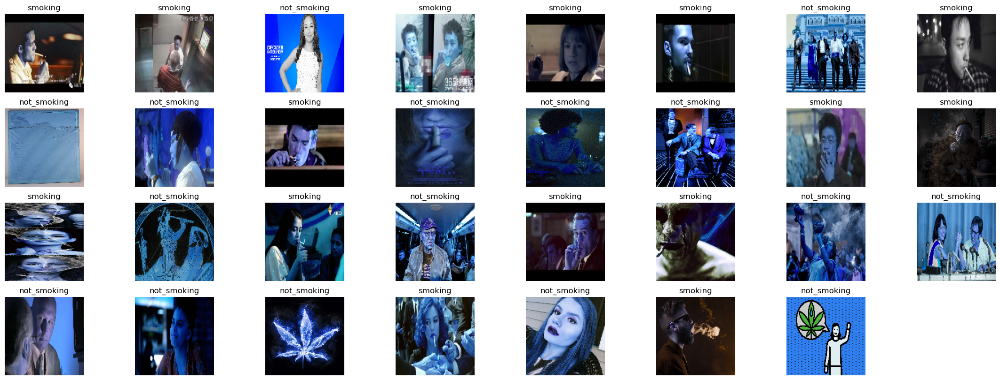

In [5]:
counter = 0
not_smoking_imgs_path = [not_smoking_path + '/' + i for i in not_smoking_imgs]
smoking_imgs_path = [smoking_path + '/' + j for j in smoking_imgs]
all_imgs = not_smoking_imgs_path + smoking_imgs_path
random.shuffle(all_imgs)

plt.figure(figsize=(28, 10))
for img_path in all_imgs:
    try:
        plt.subplot(4, 8, counter + 1)
        img = cv2.imread(img_path)
        img = cv2.resize(img, IMAGE_SIZE)
        label = img_path[len(training_path) + 1: img_path.rfind('/')]
        plt.imshow(img)
        plt.title(label)
        plt.axis('off')
        counter += 1
    except Exception as e:
        pass

### ▶️Step 3) Exploratory Data Analysis (EDA)

In [6]:
def check_cnt_label(label: str) -> int:
    """A function that should determine the number of objects of this
    class in the specified directories"""
    cnt_object = 0
    paths = [training_path, test_path]
    for path in paths:
        path += '/' + label
        cnt_object += len(os.listdir(path))
    return cnt_object

CNT_NOT_SMOKING = check_cnt_label('not_smoking')
CNT_SMOKING = check_cnt_label('smoking')

In [7]:
fig = go.Figure()
fig.add_trace(go.Bar(
    x=['not_smoking', 'smoking'],
    y=[CNT_NOT_SMOKING , CNT_SMOKING ],
    width=[0.4, 0.4]))

fig.update_layout(title='Classes and their number in the dataset', title_x=0.5)

In [8]:
rescale = Rescaling(scale=1.0 / 255)

train_ds = train_ds.map(lambda image, label: (rescale(image), label))

valid_ds  = valid_ds.map(lambda image, label: (rescale(image), label))

test_ds = test_ds.map(lambda image, label: (rescale(image), label))

### 📈Step 4) Creating a CNN Model

### Convolutional Layer
The convolutional layer is the core building block of a CNN, and it is where the majority of computation occurs. It requires a few components, which are input data, a filter, and a feature map. Let’s assume that the input will be a color image, which is made up of a matrix of pixels in 3D. This means that the input will have three dimensions—a height, width, and depth—which correspond to RGB in an image. We also have a feature detector, also known as a kernel or a filter, which will move across the receptive fields of the image, checking if the feature is present. This process is known as a convolution.

### Keras Conv2D 
Is a 2D Convolution Layer, this layer creates a convolution kernel that is wind with layers input which helps produce a tensor of outputs.This layer creates a convolution kernel that is convolved with the layer input to produce a tensor of outputs. If use_bias is True, a bias vector is created and added to the outputs. Finally, if activation is not None, it is applied to the outputs as well.
When using this layer as the first layer in a model, provide the keyword argument input_shape (tuple of integers, does not include the sample axis), e.g. input_shape=(128, 128, 3) for 128x128 RGB pictures in data_format="channels_last".

##### Arguments:
filters: Integer, the dimensionality of the output space (i.e. the number of output filters in the convolution).

kernel_size: An integer or tuple/list of 2 integers, specifying the height and width of the 2D convolution window. Can be a single integer to specify the same value for all spatial dimensions.

strides: An integer or tuple/list of 2 integers, specifying the strides of the convolution along the height and width. Can be a single integer to specify the same value for all spatial dimensions. Specifying any stride value != 1 is incompatible with specifying any dilation_rate value != 1.

padding: one of "valid" or "same" (case-insensitive).

kernel_initializer: Initializer for the kernel weights matrix.

bias_initializer: Initializer for the bias vector.

kernel_regularizer: Regularizer function applied to the kernel weights matrix.

bias_regularizer: Regularizer function applied to the bias vector.

activity_regularizer: Regularizer function applied to the output of the layer (its "activation").

kernel_constraint: Constraint function applied to the kernel matrix.

bias_constraint: Constraint function applied to the bias vector.

#### Max Pooling:
Pooling means combining a set of data. The process of combining data follows some rules.
By definition, max pool takes the maximum value of a defined grid.Max pooling is used to reduce the dimensions. It can also avoid overfitting. Check out this blog for a better understanding on Max Pooling.Max Pooling returns the maximum value from the portion of the image covered by the Kernel. On the other hand, Average Pooling returns the average of all the values from the portion of the image covered by the Kernel.

#### Flatten
Flattening is done to convert the multidimensional data into a 1D feature vector to be used by the next layer which is the Dense Layer

#### Dense Layer
The Dense layer is just a layer of Artificial Neural Network

#### Dropout:
Dropout is a regularization technique for reducing overfitting in neural networks by preventing complex co-adaptations on training data. It is a very efficient way of performing model averaging with neural networks. The term "dropout" refers to dropping out units (both hidden and visible) in a neural network.



In [46]:
Epochs=15
NAME='smoke vs non-smoke'
CALLBACKS = [
    callbacks.EarlyStopping(monitor='loss', min_delta=0.01, patience=3, verbose=1),  
    callbacks.ReduceLROnPlateau(monitor='loss', factor=0.1, min_delta=0.01, min_lr=1e-10, patience=2, verbose=1, mode='auto'),
    callbacks.TensorBoard(log_dir='logss/{}'.format(NAME))
]

In [10]:
from keras.layers import Conv2D, MaxPooling2D, Dense, Dropout, Flatten

In [11]:
model = Sequential()

model.add(Conv2D(8, kernel_size=(3, 3), activation='relu', input_shape=(150,150,3)))

model.add(Conv2D(16, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Conv2D(32, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(32, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))

model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

#### Optimizer:
Optimization algorithms helps us to minimize (or maximize) an Objective function (another name for Error function) E(x) which is simply a mathematical function dependent on the Model’s internal learnable parameters which are used in computing the target values(Y) from the set of predictors(X) used in the model. For example — we call the Weights(W) and the Bias(b) values of the neural network as its internal learnable parameters which are used in computing the output values and are learned and updated in the direction of optimal solution i.e minimizing the Loss by the network’s training process and also play a major role in the training process of the Neural Network Model .

#### LossFunction
A loss function indicates how the model is behaving while dealing with training data. It's a direct measure of the distance between what the model is producing, and what it should be. Beware of aiming at getting a perfect behaviour of the model on the training data! You'd fall into the overfitting trap: you're model would perfectly learn the training data by heart, but would be unable to generalise predictions to new and previously unseen data



In [12]:
model.compile(metrics=['Accuracy'], loss='binary_crossentropy', optimizer='Adam')

In [13]:
history = model.fit(train_ds, epochs=Epochs, validation_data=valid_ds, callbacks=CALLBACKS)

Epoch 1/15
16/16 [==============================] - 124s 6s/step - loss: 0.7653 - Accuracy: 0.5194 - val_loss: 0.6714 - val_Accuracy: 0.6205 - lr: 0.0010
Epoch 2/15
16/16 [==============================] - 116s 6s/step - loss: 0.6350 - Accuracy: 0.6086 - val_loss: 0.6001 - val_Accuracy: 0.6205 - lr: 0.0010
Epoch 3/15
16/16 [==============================] - 119s 6s/step - loss: 0.5904 - Accuracy: 0.6166 - val_loss: 0.5938 - val_Accuracy: 0.6921 - lr: 0.0010
Epoch 4/15
16/16 [==============================] - 117s 6s/step - loss: 0.5816 - Accuracy: 0.6755 - val_loss: 0.5827 - val_Accuracy: 0.6993 - lr: 0.0010
Epoch 5/15
16/16 [==============================] - 116s 6s/step - loss: 0.5666 - Accuracy: 0.7285 - val_loss: 0.5739 - val_Accuracy: 0.7208 - lr: 0.0010
Epoch 6/15
16/16 [==============================] - 117s 6s/step - loss: 0.5367 - Accuracy: 0.7243 - val_loss: 0.5601 - val_Accuracy: 0.7446 - lr: 0.0010
Epoch 7/15
16/16 [==============================] - 117s 6s/step - loss: 0.5

### ▶️Model Evaluation

In [18]:
test_result = model.evaluate(test_ds, verbose=0)[1]
train_result = model.evaluate(train_ds, verbose=0)[1]
print(f'Metric on test: {test_result}')
print(f'Metric on train: {train_result}')

Metric on test: 0.7124999761581421
Metric on train: 0.8303872346878052


C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWar

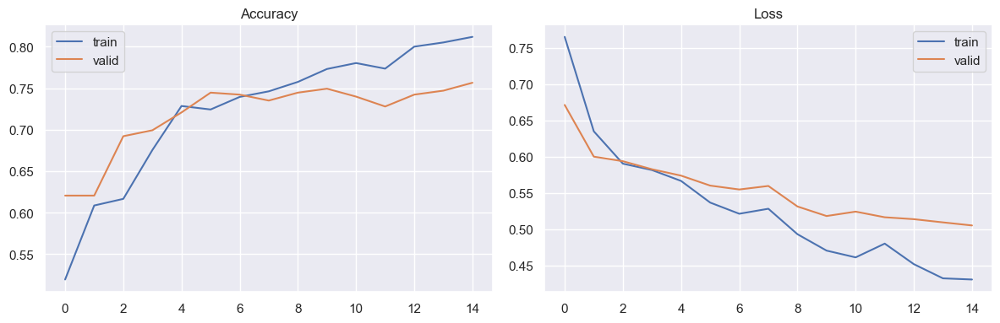

In [26]:
# Plotting a graph to see train and validation accuracy over the epochs
from matplotlib import pyplot
import seaborn as sns
sns.set()
fig = pyplot.figure(0, (12, 4))

ax = pyplot.subplot(1, 2, 1)
sns.lineplot(history.epoch, history.history['Accuracy'], label='train')
sns.lineplot(history.epoch, history.history['val_Accuracy'], label='valid')
pyplot.title('Accuracy')
pyplot.tight_layout()

ax = pyplot.subplot(1, 2, 2)
sns.lineplot(history.epoch, history.history['loss'], label='train')
sns.lineplot(history.epoch, history.history['val_loss'], label='valid')
pyplot.title('Loss')
pyplot.tight_layout()

#pyplot.savefig('epoch_history_CNN.png')
pyplot.show()

In [36]:
#Predicted plot of the model.

def test_model(path, model, int_type):
    pred=[]
    _path = path
    label = None
    predict_label = None
    if int_type == 0:
        _path = _path + "/" + "not_smoking"
        label = 0
    else:
        _path = _path + "/" + "smoking"
        label = 1
    
    plt.figure(figsize=(30, 30))
    plt.subplots_adjust(top=None, bottom=None, left=None, right=None, wspace=0.2, hspace=0.5)
    lst_img_name = os.listdir(_path)
    for i in range(1, 17, 1):
        th = np.random.randint(0, len(lst_img_name) - 1)
        plt.subplot(4, 4, i)
        img = _path + "/" + lst_img_name[th]
        image_test = image.load_img(img, target_size=(150,150, 3))
        image_test = image.img_to_array(image_test)
        image_test = np.expand_dims(image_test, axis = 0)
        predict = model.predict(image_test)
        #pred.append(predict)
        
        img = cv2.imread(img)
        plt.imshow(img)
        
        if predict[0][0] > 0.5:
            predict_label = "Predic: smoking"
            pred.append("smoking")
        else:
            predict_label = "Predic: Not_Smoking"
            pred.append("Not_Smoking")
            
        if label == 0:
            plt.title("Real: Not_smoking" + " - " + predict_label)
        else:
            plt.title("Real: Smoking" + " - " + predict_label)

1/1 [==============================] - 0s 69ms/step


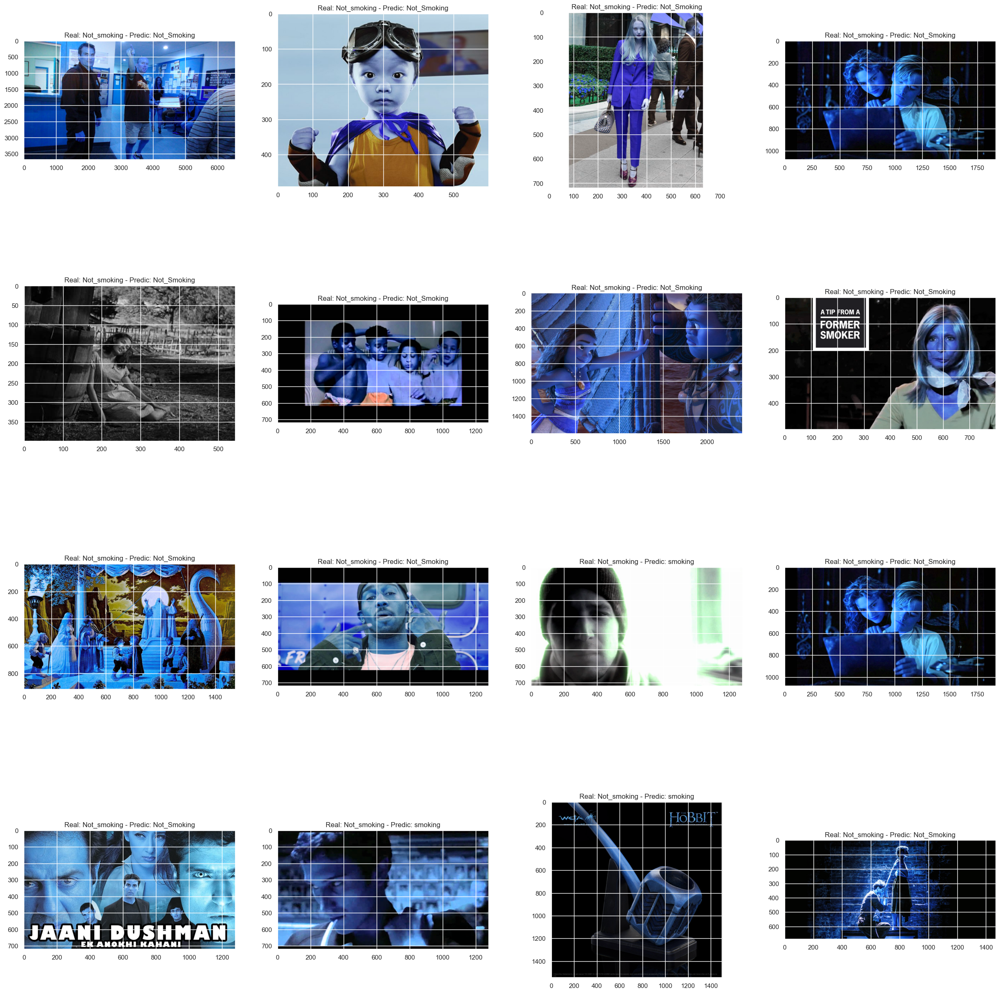

In [37]:
test_model(test_path, model, 0) 

1/1 [==============================] - 0s 49ms/step


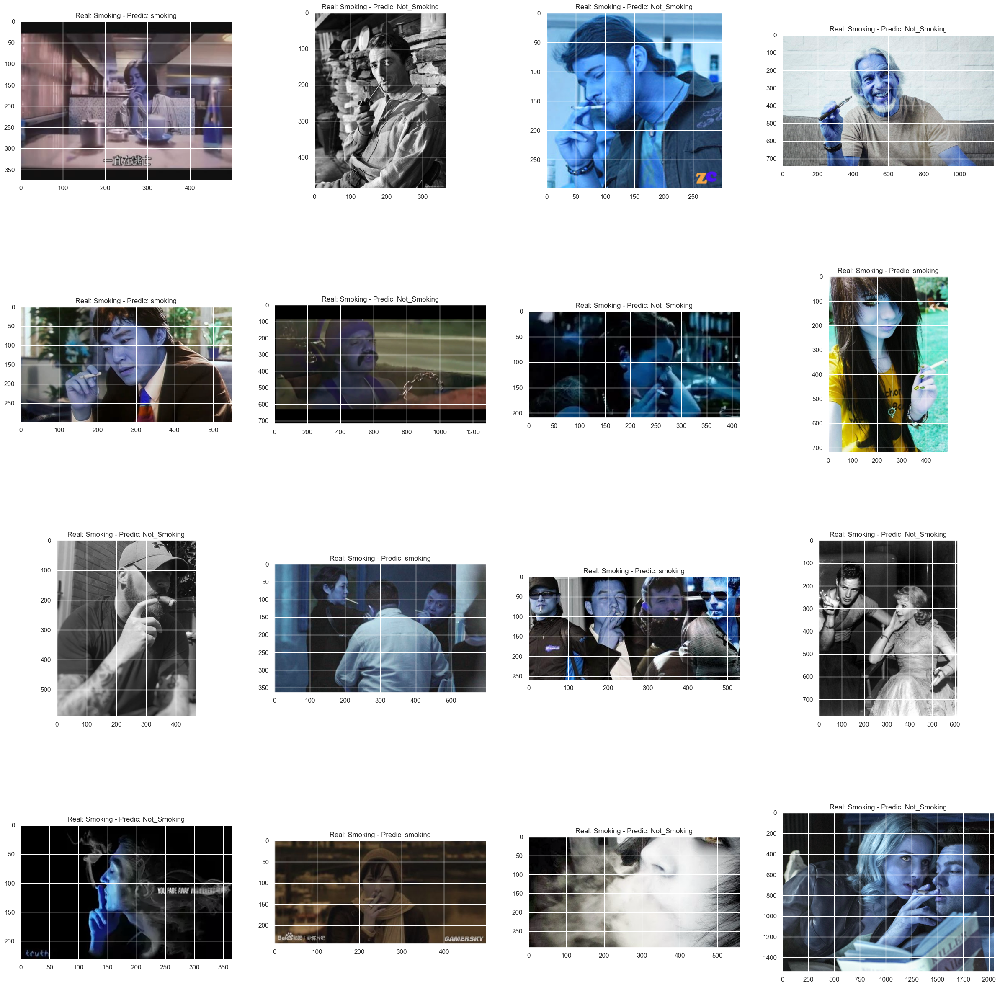

In [38]:
test_model(test_path, model, 1)